<a href="https://colab.research.google.com/github/NickKar30/GM-HSE-AI-masters-course/blob/main/homeworks/base/GenDL_HT4_Base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Домашнее задание 4: авторегрессионные модели и мультимодальность

В этом домашнем задании вам предлагается обучить авторегрессионную модель для генерации изображений (PixelCNN), а также сделать подход мультимодальным,  обусловив модель на CLIP-эмбеддинги.

# Рекомендации (sanity check) по обучению модели

1) Обучите вашу модель на выборке из 100 картинок (первые 100 из датасета) + всех возможных кепшенов для них. Модель должна переобучится под эти 100 картинки и выдавать очень низкий bpd и генерить хорошие картинки. Это санити чек для задачи 4 и 5. Оставьте этот ран в ноутбуке, чтобы мы тоже видели (постарайтесь сделать это красиво, не копипастя все клетки ноутбука, а именно конфигурируя эксперимент)

2) Идем на весь датасет, чтобы научиться обобщаться на разные картинки и промпты. Хорошая в рамках дз модель должна научится как минимум рисовать background-ы и иногда показывать очертания птиц. Чтобы птицы (или что-то на них похожее) стали более видны (и cond и uncond), используйте температуру при сэмплировании (подумайте почему это влияет). Будет заметно влиятнее промпта

В задаче можно точно выбить bpd в 8.9 — как ориентир после долгого обучения. 9.8 должно выбиваться довольно быстро.

In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu124

Looking in indexes: https://download.pytorch.org/whl/cu124



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


### Задание 1 (0 баллов)

Скачайте [датасет про птиц с HuggingFace](https://huggingface.co/datasets/weiywang/CUB_200_2011_CAP).

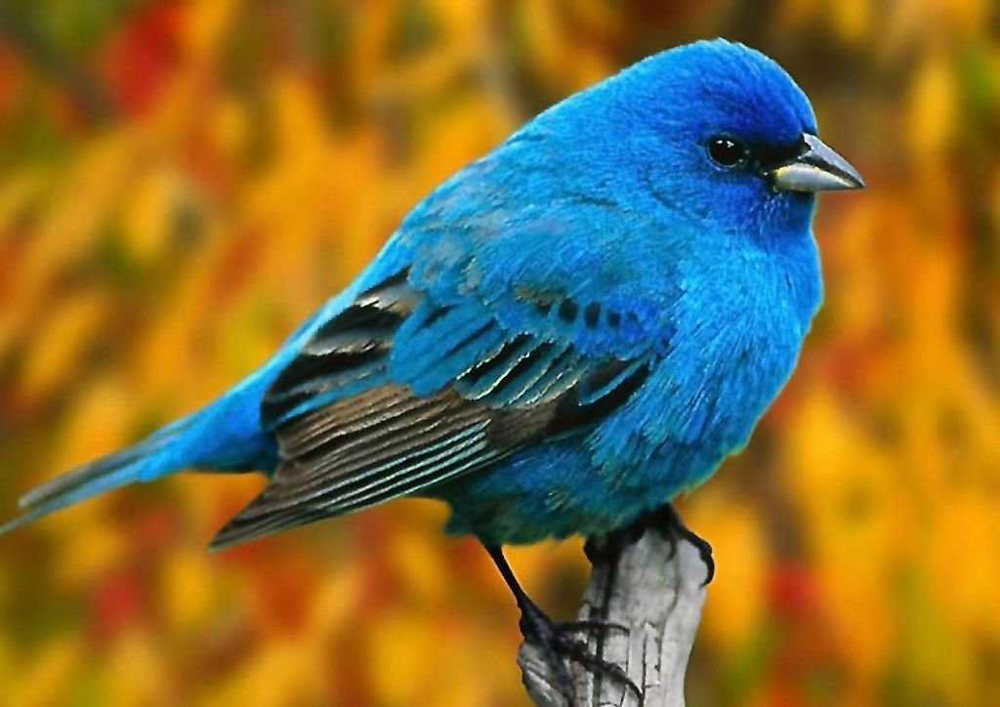

In [ ]:
!pip install --quiet pytorch-lightning>=1.4
!pip install -q git+https://github.com/openai/CLIP.git
!pip install --upgrade transformers


[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from torchvision.transforms import Resize, ToTensor
from tqdm import tqdm
import pytorch_lightning as pl
import torch.nn.functional as F
from torchmetrics.functional import accuracy
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint
import math
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import clip
from datasets import load_dataset

In [ ]:
ds = load_dataset("weiywang/CUB_200_2011_CAP", split="train")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/372 [00:00<?, ?B/s]

data/train-00000-of-00003.parquet:   0%|          | 0.00/385M [00:00<?, ?B/s]

data/train-00001-of-00003.parquet:   0%|          | 0.00/387M [00:00<?, ?B/s]

data/train-00002-of-00003.parquet:   0%|          | 0.00/376M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/11787 [00:00<?, ? examples/s]

In [ ]:
ds

Dataset({
    features: ['image', 'text', 'label'],
    num_rows: 11787
})

### UPD: VQ-VAE

VQ-VAE - это автоэнкодер, который позволяет сжимать большие входные изображения в дискретное латентное пространство (последовательность кодов) и декодировать их обратно (см. рис).

<img src="https://substackcdn.com/image/fetch/$s_!dRiM!,f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fsubstack-post-media.s3.amazonaws.com%2Fpublic%2Fimages%2F81630fcc-b23e-4f06-831f-690aff70e03b_1215x476.png" width="800" height="400">

VQ-VAE состоит из трех частей. Энкодер кодирует входное изображение $x \in \mathbb{R}^{B \times C \times H \times W}$ в непрерывное латентное пространство $z_e \in \mathbb{R}^{B \times D \times H_{h} \times W_{h}}$. Quantizer смотрит на каждый вектор из $z_e$ ($H_{h} \times W_{h}$ штук длины $D$) и заменяет их на ближайший похожий вектор из словаря-векторов (codebook), который обучался вместе с моделью. Сам $z_e$после такой операции заменяется на $z_q$ (те же размеры, но каждый вектор заменен на ближайшего из кодбука). $z_q$ можно хранить либо как непрерывный тензор $\mathbb{R}^{B \times D \times H_{h} \times W_{h}}$, либо просто хранить $B \times  H_{h} \times W_{h}$ дискретных индексов из кодбука, где индексы соответствуют номеру вектора в кодбуке (для примера, если у нас 4096 векторов в кодбуке и мы $z_e$ заменили на вектора на местах $1, 2000, 2, 10$ из кодбука, то теперь $z_q$ в дискретном виде это просто массив $1, 200, 2, 10$). Декодер, последняя часть VQ-VAE, берет $z_q$ и переводит из кодов обратно в вектора из кодбука (если $z_q$ был в виде кодов, а не векторов) и прогоняет $z_q$ через набор слоев, чтобы получить изображение $\hat{x} \simeq x$.


$H_{h} \times W_{h}$ как правило сильно меньше оригинальных $H \times W$, поэтому многие генеративные модели используют VQ-VAE для генерации высококачественных изображений без значительного усложнения вычислительной сложности. Действительно, если вместо авторегрессионной генерации $С \times H \times W$, где $H, W \ge 128$ мы будем работать с дискретным тензором $H_{h} \times W_{h}$, где $H_h, W_h \le 32$, то мы сможем генерировать качественные изображения с той же вычислительной сложностью как если бы сделали resize изначальных картинок в $32\times32$, но при этом не теряем в качестве изображений (ведь финальное изображение получается прогоном кодов через декодер).

Давайте посмотрим как это работает:

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
# Скачаем предобученную VQ-VAE

from diffusers import VQModel
vqvae = VQModel.from_pretrained("microsoft/vq-diffusion-ithq", subfolder="vqvae")
vqvae.to(device)

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
An error occurred while trying to fetch microsoft/vq-diffusion-ithq: microsoft/vq-diffusion-ithq does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


VQModel(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 64, eps=1e-06, affine=True)
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 64, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 64, eps=1e-06, affine=True)
            (conv1): Conv2d(64

Скачаем картинку для примера

In [ ]:
!wget "https://upload.wikimedia.org/wikipedia/commons/1/16/Myophonus_caeruleus_-_Ang_Khang_edit1.jpg" -O example.jpg

--2025-12-01 16:44:28--  https://upload.wikimedia.org/wikipedia/commons/1/16/Myophonus_caeruleus_-_Ang_Khang_edit1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1474949 (1.4M) [image/jpeg]
Saving to: ‘example.jpg’

example.jpg         100%[===================>]   1.41M  2.12MB/s    in 0.7s    

2025-12-01 16:44:29 (2.12 MB/s) - ‘example.jpg’ saved [1474949/1474949]



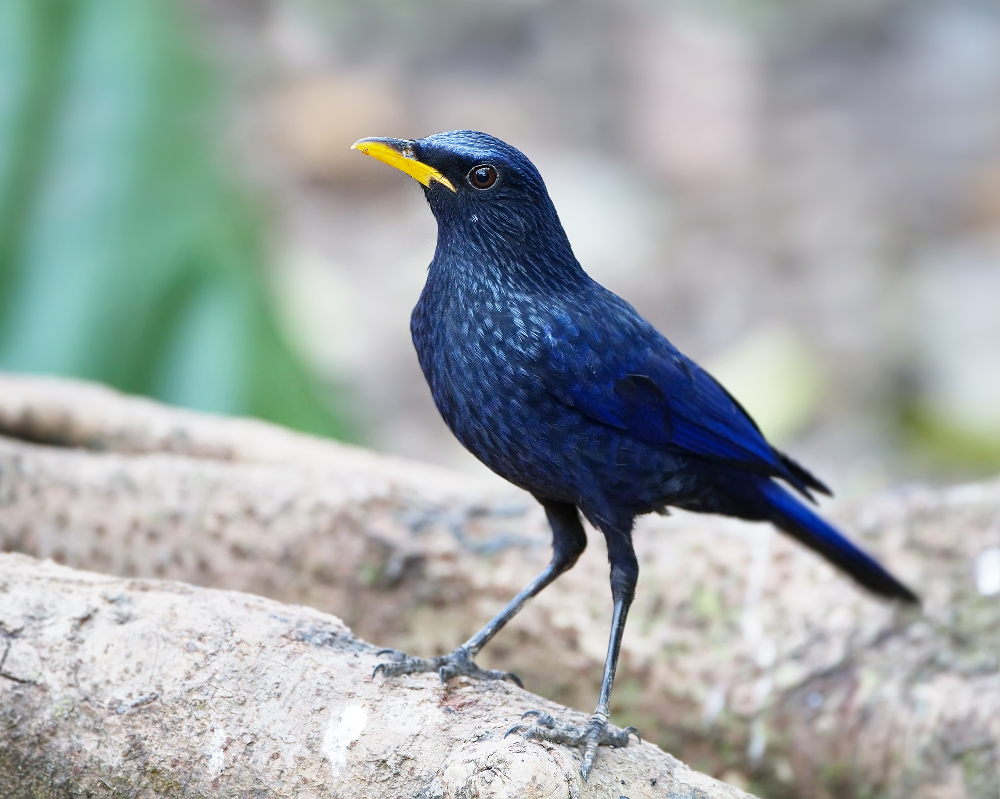

In [ ]:
from PIL import Image

img = Image.open("example.jpg")
img

VQ-VAE этот работает на изображениях $256\times 256$, поэтому ресайзим

In [ ]:
from torchvision import transforms

x = transforms.Resize((256, 256))(img)
x = transforms.ToTensor()(x)
x.shape

torch.Size([3, 256, 256])

Код для получения кодов и декодирования изображения:

In [ ]:
def img_to_codes(x, vqvae):
    if x.ndim != 4:
        x = x.unsqueeze(0)
    # для нормализации вход не [0, 1], а [-1, 1]
    x = x * 2 - 1
    # применяем энкодер
    latent = vqvae.encode(x).latents
    # получаем z_q и соответствующие коды
    quant, commit_loss, (_, _, indices) = vqvae.quantize(latent)
    # коды тут flatten, решейпим обратно
    B, _, Hc, Wc = latent.shape
    if indices.dim() == 1:
        codes = indices.view(B, Hc, Wc)
    else:
        codes = indices
    return codes

def codes_to_img(codes, vqvae):
    B, Hc, Wc = codes.shape
    codes = codes.view(-1)
    # получаем непрерывное z_q из соответствующих кодов,
    # смотря на вектора из кодбука по индексам
    quant = vqvae.quantize.get_codebook_entry(
        codes,
        shape=(B, Hc, Wc, vqvae.quantize.vq_embed_dim)  # (B, H, W, C)
    )
    # декодируем
    quant2 = vqvae.post_quant_conv(quant)
    dec = vqvae.decoder(quant2, quant if vqvae.config.norm_type == "spatial" else None)
    return (dec + 1) / 2

Применим:

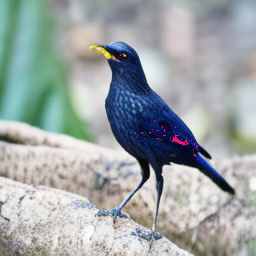

In [ ]:
codes = img_to_codes(x.to(device), vqvae)
hat_x = codes_to_img(codes, vqvae)
transforms.ToPILImage()(hat_x[0])

In [ ]:
codes

tensor([[[ 817, 2035, 1131,  ..., 2121, 3251,  308],
         [ 959, 3175, 3348,  ...,  798,  890,  626],
         [4008,  485, 1446,  ...,  300, 2945,  113],
         ...,
         [1287, 3999, 2154,  ..., 1070, 2207, 1166],
         [3132, 4010,  896,  ...,  729, 2359, 3617],
         [1282, 1434, 3435,  ...,  312,  109, 1547]]], device='cuda:0')

Видим, что у нас получилось довольно хорошо восстановить изображения из кодов. Но какие размеры у `codes`?

In [ ]:
codes.shape

torch.Size([1, 32, 32])

$B=1$, т.е. вместо $3\times 256\times 256$ (RGB) мы получаем всего лишь $32\times 32$.

Раньше, дискретных значений было в одном пикселе было $3 \cdot 256$ (цвета в RGB по каждому каналу). Теперь кол-во дискретных значения задается количеством кодов в кодбуке vqvae $N_q$

In [ ]:
vqvae.config.num_vq_embeddings

4096

Как и прежде, мы можем генерировать подобные дискретные тензоры авторегрессионно с помощью PixelCNN, но если раньше мы работали в пространстве изображений, то теперь будем работать в латентном. Как и раньше, мы будем считать, что $32\times32$ тензор это последовательность токенов со значениями из $[0, N_q-1]$, которую мы считываем построчно слево направо. Наш PixelCNN, как и раньше, будет смотреть только на предыдущие токены, чтобы генерировать новый. Модель каждый шаг будет предсказывать вероятностное распределение на словаре: $[0, N_q-1]$

То есть, все буквально, как и раньше, но вместо RGB изображений, мы будем генерировать `codes`. Чтобы получить RGB, мы просто прокинем codes через декодер VQ-VAE и получим RGB изображений в высоком разрешении.

P.S. Поскольку VQ-VAE сильно сжимает изображение, мы заодно избавляемся от высокочастотного шума, который присутствует в цветных натуральных изображениях и мешает авторегрессионным генераторам делать хорошую генерацию. В изначальной версии ДЗ PixelCNN могло получить хороший bpd, но генерировало RGB шум из-за слишком разнообразного фона на картинках птиц. VQ-VAE, засчет сжатия, делает каждый токен очень значимым (нет двух соседних токенов, которые по сути отвечают лишь за две соседние маленькие точки фона, мешая PixelCNN обучиться). Действительно, если изначально картинка была с стороной 256, а стала с 32 в  `codes`, то каждый токен отвечает за участок размера $8\times8$, что куда более значимо, чем один пиксель в исходном изображении. Можно было бы сказать, что такого же эффекта "значимости" можно было бы добиться просто resize в $32\times 32$ RGB картинки, но PixelCNN путался бы из-за цветов (3 канала в RGB, в `codes` нет каналов), а также сами пиксели имели бы лишь поверхностное значение. В VQ-VAE токены смоделированы специально для сжатия и восстановления обратно в $256\times 256$, поэтому каждый токен содержит в себе более глубокую и детальную информацию, чем просто resize-нутый пиксель.

### Задание 2 (1 балл).

Скачайте любую версию предобученного CLIP на ваш вкус, примените текстовый кодировщик к описаниям птиц из датасета (столбец "text") и сохраните получившиеся эмбеддинги.

Возьмите из датасета две картинки с визуально похожими птицами и посчитайте косинусную близость эмбеддингов подписей к этим фото, оцените корректность результата.

In [ ]:
model_clip, preprocess = clip.load("RN50x64")
model_clip.eval()

CLIP(
  (visual): ModifiedResNet(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)


In [ ]:
text_embs = []
with torch.no_grad():
    for f in ds:
        text = f["text"]
        tokens = clip.tokenize(text, truncate=True).to(device)
        emb = model_clip.encode_text(tokens).float()
        emb = emb/emb.norm(dim=-1, keepdim=True)
        text_embs.append(emb.cpu())

In [ ]:
text_embs = torch.cat(text_embs, dim=0)

In [ ]:
text_embs.shape

torch.Size([11787, 1024])

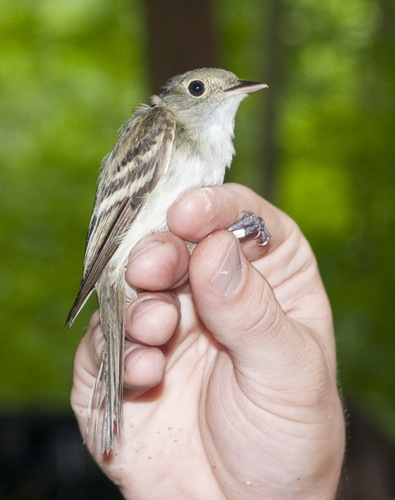

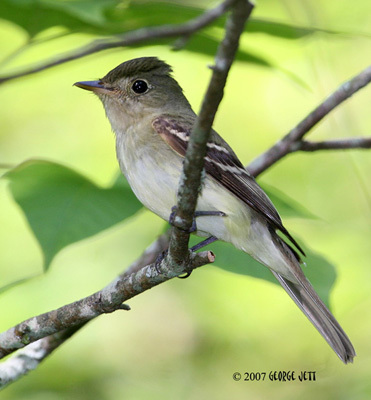

In [ ]:
img1 = ds[10]["image"]
img2 = ds[13]["image"]
display(img1)
display(img2)

In [ ]:
text1 = ds[10]["text"]
text2 = ds[13]["text"]

In [ ]:
with torch.no_grad():
    tensor1 = model_clip.encode_text(clip.tokenize(text1, truncate=True).to(device))
    tensor1 = tensor1 / tensor1.norm(dim=-1, keepdim=True)
    tensor2 = model_clip.encode_text(clip.tokenize(text2, truncate=True).to(device))
    tensor2 = tensor2 / tensor2.norm(dim=-1, keepdim=True)
cos = torch.nn.CosineSimilarity(dim=1)
output = cos(tensor1, tensor2)

In [ ]:
output

tensor([0.8745], device='cuda:0', dtype=torch.float16)

Косинусное расстояние получилось равным 0.8745, большое значение. Значит, текстовые описания двух птиц сильно похожи.

### Задание 3 (0.5 балла).

Соберите картинки и получившиеся эмбеддинги в датасеты. Сохраните два датасета: один только с изображениями, другой - с изображениями и эмбеддингами подписей.

- Сконвертируйте картинки в соответствующие `codes` (используйте функции выше)

Hint: внимательно посмотрите на кол-во каналов в изображениях датасета и размеры картинок, предобработайте картинки перед подачей в VQ-VAE

Hint 2: сначала используется сабсет из вашего датасета для дебага, потому что датасет конвертируется долго, после дебага используйте весь

In [ ]:
for i in range(len(ds)):
    img = ds[i]['image']
    img_array = np.array(img)
    if len(img_array.shape) != 3:
        print(f'{i} - {img_array.shape}')

1778 - (333, 500)
2901 - (500, 500)
5765 - (326, 500)
5785 - (398, 500)
6555 - (500, 485)
10617 - (281, 500)
11144 - (500, 484)


In [ ]:
class BirdsSubset(Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item['image']
        text = item['text']
        if self.transform:
            image = self.transform(image)
        return image, text

In [ ]:
def rgb(img):
    if img.mode != 'RGB':
        img = img.convert('RGB')
    return img

In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.Lambda(lambda x: rgb(x)),
    transforms.ToTensor(),
])

In [ ]:
ds_small = ds.select(range(100))
dataset_small = BirdsSubset(ds_small, transform)

In [ ]:
dataset_small[0]

(tensor([[[0.0392, 0.0471, 0.0431,  ..., 0.0549, 0.0588, 0.0510],
          [0.0706, 0.1647, 0.1765,  ..., 0.1922, 0.1882, 0.1020],
          [0.0706, 0.2235, 0.3020,  ..., 0.3255, 0.2549, 0.0980],
          ...,
          [0.0784, 0.2431, 0.3412,  ..., 0.3294, 0.2510, 0.0863],
          [0.0824, 0.1922, 0.2118,  ..., 0.2000, 0.1922, 0.0941],
          [0.0510, 0.0667, 0.0667,  ..., 0.0667, 0.0706, 0.0549]],
 
         [[0.0392, 0.0510, 0.0471,  ..., 0.0549, 0.0549, 0.0431],
          [0.0784, 0.1608, 0.1686,  ..., 0.1922, 0.1843, 0.0941],
          [0.0745, 0.2118, 0.2824,  ..., 0.3216, 0.2510, 0.0941],
          ...,
          [0.0784, 0.2392, 0.3373,  ..., 0.3176, 0.2392, 0.0863],
          [0.0824, 0.1922, 0.2118,  ..., 0.1961, 0.1843, 0.0941],
          [0.0510, 0.0667, 0.0667,  ..., 0.0627, 0.0667, 0.0549]],
 
         [[0.0314, 0.0431, 0.0392,  ..., 0.0471, 0.0471, 0.0471],
          [0.0588, 0.1333, 0.1373,  ..., 0.1804, 0.1725, 0.0902],
          [0.0588, 0.1765, 0.2392,  ...,

In [ ]:
codes_list = []
for i in tqdm(range(len(dataset_small))):
    img, _ = dataset_small[i]
    with torch.no_grad():
        code = img_to_codes(img.to(device), vqvae)
        codes_list.append(code.cpu())
codes_tensor = torch.cat(codes_list, dim=0)

100%|██████████| 100/100 [00:03<00:00, 29.45it/s]


In [ ]:
codes_tensor.shape

torch.Size([100, 32, 32])

In [ ]:
class CodesImgDataset(Dataset):
    def __init__(self, codes_tensor):
        self.codes = codes_tensor

    def __len__(self):
        return self.codes.shape[0]

    def __getitem__(self, idx):
        return self.codes[idx]

class CodesTextDataset(Dataset):
    def __init__(self, codes_tensor, text_features_tensor):
        self.codes = codes_tensor
        self.text_features = text_features_tensor

    def __len__(self):
        return self.codes.shape[0]

    def __getitem__(self, idx):
        return self.codes[idx], self.text_features[idx]

In [ ]:
dataset_img = CodesImgDataset(codes_tensor)
dataset_img_txt = CodesTextDataset(codes_tensor, text_embs[:100])

# Собираем полный датасет

In [ ]:
dataset = BirdsSubset(ds, transform)

In [ ]:
codes_list_full = []
for i in tqdm(range(len(dataset))):
    img, _ = dataset[i]
    with torch.no_grad():
        code = img_to_codes(img.to(device), vqvae)
        codes_list_full.append(code.cpu())
codes_tensor_full = torch.cat(codes_list_full, dim=0)

100%|██████████| 11787/11787 [06:51<00:00, 28.67it/s]


Сохраняю данные, чтобы потом не запускать те же ячейки и ждать вновь

In [ ]:
save_dir = "./data"
os.makedirs(save_dir, exist_ok=True)
codes_path = os.path.join(save_dir, "codes_tensor_full.pt")
text_embs_path = os.path.join(save_dir, "text_embs.pt")
torch.save(codes_tensor_full, codes_path)
torch.save(text_embs, text_embs_path)

In [ ]:
load_dir = "./data"
codes_path = os.path.join(load_dir, "codes_tensor_full.pt")
text_embs_path = os.path.join(load_dir, "text_embs.pt")
codes_tensor_full = torch.load(codes_path)
text_embs = torch.load(text_embs_path)

In [ ]:
dataset_img_full = CodesImgDataset(codes_tensor_full)
dataset_img_txt_full = CodesTextDataset(codes_tensor_full, text_embs)

### Задание 4 (2 балла).

- Обучите [модель из семинара (PixelCNN)](https://colab.research.google.com/drive/1EIsBxlTcz3ZB0j-ZxN1gWD2dSQq6krPj?usp=sharing) только на `codes` птиц. Модифицируйте размерности тензоров в модели, где это необходимо - чтобы она корректно работала с данными изображениями (обратите внимание на то, какие дискретные числа должны предсказывать ваша модель)

- Сделайте обучаемый `nn.Embedding` для `codes` перед подачей в слои свертки

- Вы можете менять гиперпараметры для улучшения качества генерации

- Выведите на экран 10 сгенерированных картинок, оцените результат, напишите выводы

Hint: добавьте конвертацию кодов в изображения в функцию отрисовки картинок, а не в `sample`.

Взял части кода модели из семинара

In [ ]:
class MaskedConvolution(nn.Module):

    def __init__(self, c_in, c_out, mask, **kwargs):
        """
        Implements a convolution with mask applied on its weights.
        Inputs:
            c_in - Number of input channels
            c_out - Number of output channels
            mask - Tensor of shape [kernel_size_H, kernel_size_W] with 0s where
                   the convolution should be masked, and 1s otherwise.
            kwargs - Additional arguments for the convolution
        """
        super().__init__()
        # For simplicity: calculate padding automatically
        kernel_size = (mask.shape[0], mask.shape[1])
        dilation = 1 if "dilation" not in kwargs else kwargs["dilation"]
        padding = tuple([dilation*(kernel_size[i]-1)//2 for i in range(2)])
        # Actual convolution
        self.conv = nn.Conv2d(c_in, c_out, kernel_size, padding=padding, **kwargs)

        # Mask as buffer => it is no parameter but still a tensor of the module
        # (must be moved with the devices)
        self.register_buffer('mask', mask[None,None])

    def forward(self, x):
        self.conv.weight.data *= self.mask # Ensures zero's at masked positions
        return self.conv(x)


class VerticalStackConvolution(MaskedConvolution):

    def __init__(self, c_in, c_out, kernel_size=3, mask_center=False, **kwargs):
       # Создаётся квадратная матрица из единиц (kernel_size × kernel_size), которая будет маской.
       # Все элементы ниже центральной строки зануляются (=0) → это значит, что фильтр не может смотреть вниз
       # (т.е. на пиксели ниже текущего).
        mask = torch.ones(kernel_size, kernel_size)
        mask[kernel_size//2+1:,:] = 0

       # Если mask_center=True, то обнуляется центральная строка, то есть пиксель не видит даже себя самого.
       # Это используется при самой первой свёртке, чтобы не допустить “подглядывания” текущего значения.
        if mask_center:
            mask[kernel_size//2,:] = 0

        super().__init__(c_in, c_out, mask, **kwargs)

class HorizontalStackConvolution(MaskedConvolution):

    def __init__(self, c_in, c_out, kernel_size=3, mask_center=False, **kwargs):
        mask = torch.ones(1,kernel_size)
        mask[0,kernel_size//2+1:] = 0

        if mask_center:
            mask[0,kernel_size//2] = 0

        super().__init__(c_in, c_out, mask, **kwargs)

class GatedMaskedConv(nn.Module):

    def __init__(self, c_in, **kwargs):
        """
        Gated Convolution block implemented the computation graph shown above.
        """
        super().__init__()
        self.conv_vert = VerticalStackConvolution(c_in, c_out=2*c_in, **kwargs)
        self.conv_horiz = HorizontalStackConvolution(c_in, c_out=2*c_in, **kwargs)
        self.conv_vert_to_horiz = nn.Conv2d(2*c_in, 2*c_in, kernel_size=1, padding=0)
        self.conv_horiz_1x1 = nn.Conv2d(c_in, c_in, kernel_size=1, padding=0)

    def forward(self, v_stack, h_stack):
        # Vertical stack (left)
        v_stack_feat = self.conv_vert(v_stack)
        v_val, v_gate = v_stack_feat.chunk(2, dim=1)
        v_stack_out = torch.tanh(v_val) * torch.sigmoid(v_gate)

        # Horizontal stack (right)
        h_stack_feat = self.conv_horiz(h_stack)
        h_stack_feat = h_stack_feat + self.conv_vert_to_horiz(v_stack_feat)
        h_val, h_gate = h_stack_feat.chunk(2, dim=1)
        h_stack_feat = torch.tanh(h_val) * torch.sigmoid(h_gate)
        h_stack_out = self.conv_horiz_1x1(h_stack_feat)
        h_stack_out = h_stack_out + h_stack

        return v_stack_out, h_stack_out

In [ ]:
class PixelCNN(pl.LightningModule):
    def __init__(self, c_in, c_hidden, num_embeddings):
        super().__init__()
        self.save_hyperparameters()
        self.num_embeddings = num_embeddings
        self.c_in = c_in
        self.embedding = nn.Embedding(num_embeddings, c_hidden)

        self.conv_vstack = VerticalStackConvolution(c_hidden, c_hidden, mask_center=True)
        self.conv_hstack = HorizontalStackConvolution(c_hidden, c_hidden, mask_center=True)

        self.conv_layers = nn.ModuleList([
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=4),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden)
        ])

        self.conv_out = nn.Conv2d(c_hidden, num_embeddings, kernel_size=1, padding=0)
        self.example_input_array = torch.randint(0, num_embeddings, (1, 32, 32)).long()

    def forward(self, x):
        x_emb = self.embedding(x)
        x_emb = x_emb.permute(0, 3, 1, 2)
        v_stack = self.conv_vstack(x_emb)
        h_stack = self.conv_hstack(x_emb)

        for layer in self.conv_layers:
            v_stack, h_stack = layer(v_stack, h_stack)

        out = self.conv_out(F.elu(h_stack))
        return out

    def calc_likelihood(self, x):
        pred_logits = self.forward(x)
        nll = F.cross_entropy(pred_logits, x, reduction='none')
        bpd = nll.mean(dim=[1,2]) * np.log2(np.exp(1))
        return bpd.mean()

    @torch.no_grad()
    def sample(self, img_shape, temp=1.0):
        img = torch.zeros(img_shape, dtype=torch.long).to(self.device)
        B, H, W = img_shape
        for h in tqdm(range(H), leave=False):
            for w in range(W):
                pred_logits = self.forward(img)
                logits = pred_logits[:, :, h, w]
                logits = logits / temp
                probs = F.softmax(logits, dim=-1)
                img[:, h, w] = torch.multinomial(probs, num_samples=1).squeeze(dim=-1)
        return img

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=3e-3)
        scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.95)
        return [optimizer], [scheduler]

    def training_step(self, batch, batch_idx):
        loss = self.calc_likelihood(batch)
        self.log('train_bpd', loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        loss = self.calc_likelihood(batch)
        self.log('val_bpd', loss, prog_bar=True)


In [ ]:
train_dataset, val_dataset = torch.utils.data.random_split(dataset_img, [int(0.8*len(dataset_img)), len(dataset_img) - int(0.8*len(dataset_img))], generator=torch.Generator().manual_seed(42))
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

In [ ]:
CHECKPOINT_PATH = "./checkpoints"
model = PixelCNN(c_in=1, c_hidden=128, num_embeddings=4096).to(device)

In [ ]:
trainer = pl.Trainer(
    default_root_dir=os.path.join(CHECKPOINT_PATH, "PixelCNN"),
    accelerator="gpu" if str(device).startswith("cuda") else "cpu",
    devices=1,
    max_epochs=100,
    callbacks=[
        ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_bpd"),
        LearningRateMonitor("epoch")
    ],
    log_every_n_steps=10,
    enable_progress_bar=True,
    logger=True
)
trainer.fit(model, train_loader, val_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                       | Params | Mode  | FLOPs | In sizes         | Out sizes        
------------------------------------------------------------------------------------------------------------------
0 | embedding   | Embedding                  | 524 K  | train | 0     | [1, 32, 32]      | [1, 32, 32, 128] 
1 | conv_vstack | VerticalStackConvolution   | 147 K  | train | 301 M | [1, 128, 32, 32] | [1, 128, 32, 32] 
2 | conv_hstack | HorizontalStackConvolution | 49.3 K | train | 100 M | [1, 128, 32, 32] | [1, 128, 32, 32] 
3 | conv_layers | ModuleList                 | 3.3 M  | train | 0     | ?                | ?                
4 | conv_out    | Conv2d                     | 528 K  | train | 1.1 B | [1, 128, 32, 32] | [1, 4096, 32, 32]
------------------------------------------------------------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:317: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


In [ ]:
trainer.validate(model, train_loader)[0]['val_bpd']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:485: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Validation: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_bpd            0.0107748256996274
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


0.0107748256996274

In [ ]:
model.eval()
with torch.no_grad():
    generated_codes = model.sample(img_shape=(10, 32, 32), temp=0.8)
    generated_images = []
    for i in range(generated_codes.shape[0]):
        codes = generated_codes[i].unsqueeze(0).to(device)
        img = codes_to_img(codes, vqvae)[0]
        generated_images.append(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05359453..1.2147236].


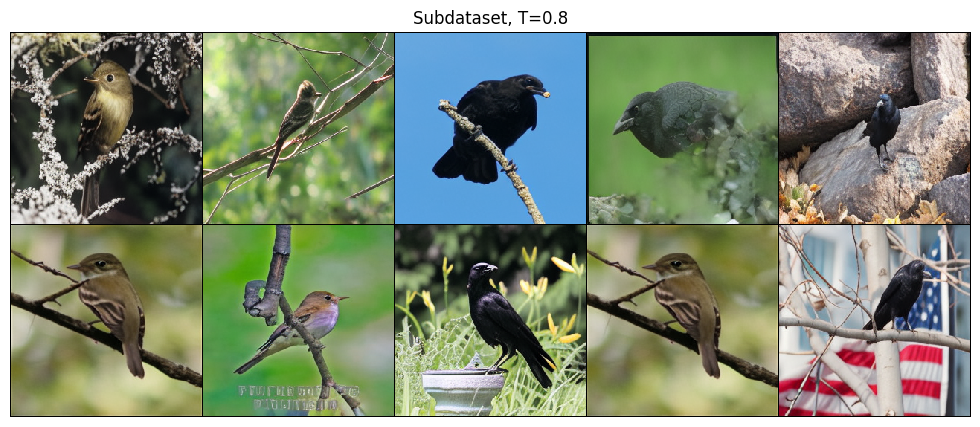

In [ ]:
def show_imgs(imgs, temp=0.8):
        num_imgs = len(imgs)
        nrow = min(num_imgs, 5)
        ncol = int(math.ceil(num_imgs/nrow))
        grid_img = make_grid(imgs, nrow=nrow, padding=2, normalize=False)
        np_img = grid_img.cpu().numpy()
        plt.figure(figsize=(2.5*nrow, 2.5*ncol))
        plt.imshow(np.transpose(np_img, (1,2,0)), interpolation='nearest')
        plt.axis('off')
        plt.title(f'Subdataset, T={temp}')
        plt.show()
        plt.close()


show_imgs(generated_images, temp=0.8)

Температура 0.8 на датасете из 100 картинок дала отличный результат. Видно и фон, и птичку

# Обучаем на полном датасете

In [ ]:
train_dataset_full, val_dataset_full = torch.utils.data.random_split(dataset_img_full, [int(0.8*len(dataset_img_full)), len(dataset_img_full) - int(0.8*len(dataset_img_full))], generator=torch.Generator().manual_seed(42))
train_loader_full = DataLoader(train_dataset_full, batch_size=32, shuffle=True)
val_loader_full = DataLoader(val_dataset_full, batch_size=32, shuffle=False)

In [ ]:
CHECKPOINT_PATH = "./checkpoints"
model_full = PixelCNN(c_in=1, c_hidden=128, num_embeddings=4096).to(device)

In [ ]:
trainer = pl.Trainer(
    default_root_dir=os.path.join(CHECKPOINT_PATH, "PixelCNN"),
    accelerator="gpu" if str(device).startswith("cuda") else "cpu",
    devices=1,
    max_epochs=45,
    callbacks=[
        ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_bpd"),
        LearningRateMonitor("epoch")
    ],
    log_every_n_steps=10,
    enable_progress_bar=True,
    logger=True
)
trainer.fit(model_full, train_loader_full, val_loader_full)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\logger_connector\logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
You are using a CUDA device ('NVIDIA GeForce RTX 4070 SUPER') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIB

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=45` reached.


In [ ]:
trainer.validate(model_full, val_loader_full)[0]['val_bpd']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Validation: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_bpd            10.339563369750977
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


10.339563369750977

In [ ]:
trainer.validate(model_full, train_loader_full)[0]['val_bpd']

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:485: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Validation: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_bpd             9.751544952392578
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


9.751544952392578

In [ ]:
model_full.eval()
with torch.no_grad():
    generated_codes = model_full.sample(img_shape=(10, 32, 32), temp=0.85)
    generated_images = []
    for i in range(generated_codes.shape[0]):
        codes = generated_codes[i].unsqueeze(0).to(device)
        img = codes_to_img(codes, vqvae)[0]
        generated_images.append(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11246967..1.1471579].


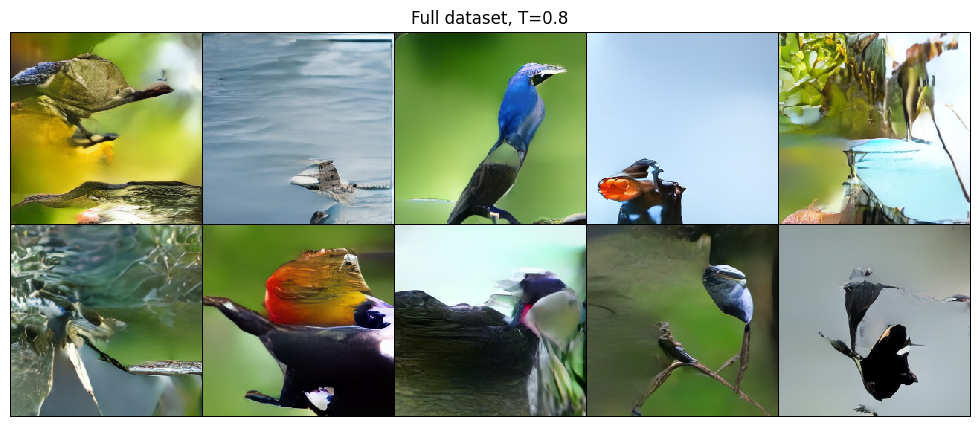

In [ ]:
show_imgs(generated_images, temp=0.8)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12560165..1.1216393].


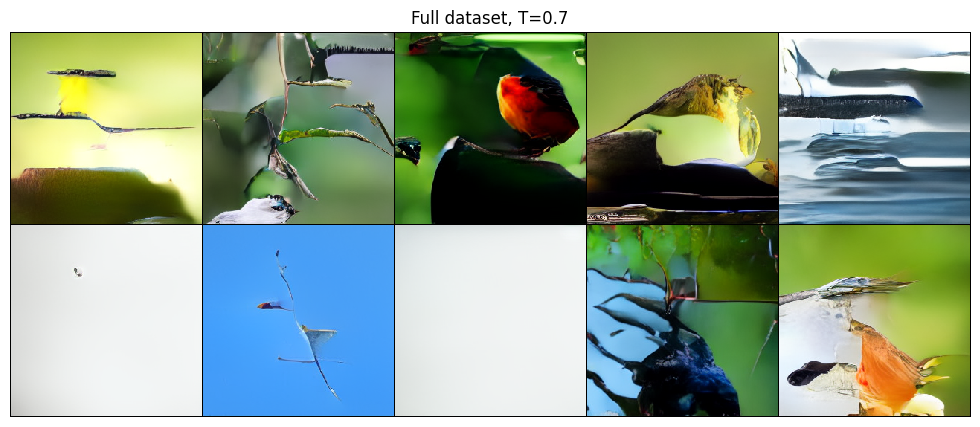

In [ ]:
show_imgs(generated_images, temp=0.7)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15888429..1.0893681].


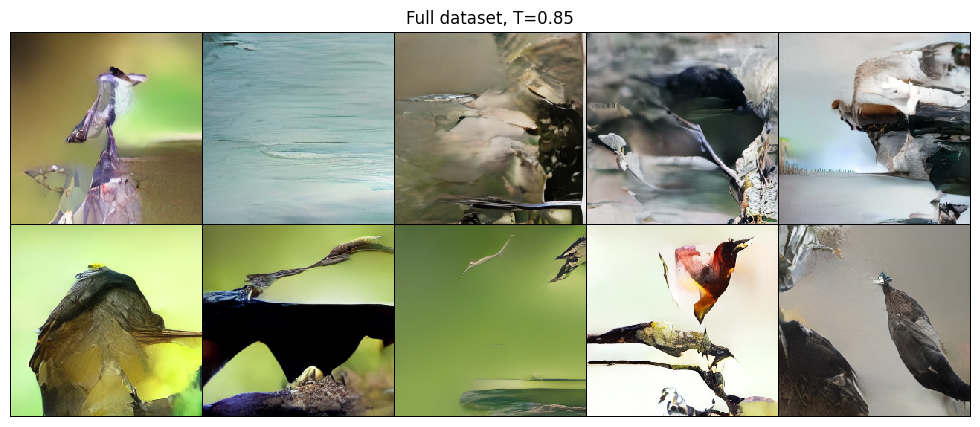

In [ ]:
show_imgs(generated_images, temp=0.85)

Для полного датасета.
Наилучший результат получился при T = 0.8. На картинках можно раглядеть очертания птиц, также понятен фон(можно понять в какой среде они находятся). Bpd = 10.3 на валидации, что является неплохим результатом, по моему мнению.

### Задание 5 (3.5 балла).

- Добавьте сохраненные эмбеддинги подписей к архитектуре PixelCNN (это можно сделать любым способом - прибавить эмбеддинги, сконкатенировать их, использовать cross-attention или любой другой подход).

- Обучите такую conditional-модель на птицах и эмбеддингах текстов, выведите на экран по 10 промптам, похожим по формату на промпты из трейна, сгенерированные картинки. Оцените результат, напишите выводы (здесь вы тоже можете менять гиперпараметры модели)

**Hint:** для улучшения качества в последующих заданиях можете прочитать сначала условие задания 6

In [ ]:
class ConditionalPixelCNN(pl.LightningModule):
    def __init__(self, c_in, c_hidden, num_embeddings, clip_emb_dim):
        super().__init__()
        self.num_embeddings = num_embeddings
        self.c_in = c_in
        self.clip_emb_dim = clip_emb_dim
        self.embedding = nn.Embedding(num_embeddings, c_hidden)
        self.conv_vstack = VerticalStackConvolution(c_hidden, c_hidden, mask_center=True)
        self.conv_hstack = HorizontalStackConvolution(c_hidden, c_hidden, mask_center=True)
        self.cond_proj = nn.Linear(clip_emb_dim, c_hidden)

        self.conv_layers = nn.ModuleList([
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=4),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden)
        ])

        self.conv_out = nn.Conv2d(c_hidden, num_embeddings, kernel_size=1, padding=0)
        self.example_input_array = [
            torch.randint(0, num_embeddings, (1, 32, 32)).long(),
            torch.randn(1, clip_emb_dim)
        ]

    def forward(self, x, clip_features):

        x_emb = self.embedding(x)
        x_emb = x_emb.permute(0, 3, 1, 2)
        v_stack = self.conv_vstack(x_emb)
        h_stack = self.conv_hstack(x_emb)

        cond_proj = self.cond_proj(clip_features).unsqueeze(-1).unsqueeze(-1)

        for layer in self.conv_layers:
            h_stack = h_stack + cond_proj
            v_stack, h_stack = layer(v_stack, h_stack)

        out = self.conv_out(F.elu(h_stack))
        return out

    def calc_likelihood(self, x, clip_features):
        pred_logits = self.forward(x, clip_features)
        nll = F.cross_entropy(pred_logits, x, reduction='none')
        bpd = nll.mean(dim=[1,2]) * np.log2(np.exp(1))
        return bpd.mean()

    @torch.no_grad()
    def sample(self, img_shape, clip_features, temp=1.0):
        img = torch.zeros(img_shape, dtype=torch.long).to(self.device)
        B, H, W = img_shape
        for h in tqdm(range(H), leave=False):
            for w in range(W):
                pred_logits = self.forward(img, clip_features)
                logits = pred_logits[:, :, h, w]
                logits = logits / temp
                probs = F.softmax(logits, dim=-1)
                sampled_tokens = torch.multinomial(probs, num_samples=1).squeeze(dim=-1)
                img[:, h, w] = sampled_tokens
        return img

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=1e-4)
        scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.95)
        return [optimizer], [scheduler]

    def training_step(self, batch, batch_idx):
        loss = self.calc_likelihood(batch[0], batch[1])
        self.log('train_bpd', loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        loss = self.calc_likelihood(batch[0], batch[1])
        self.log('val_bpd', loss, prog_bar=True)

In [ ]:
train_dataset_txt, val_dataset_txt = torch.utils.data.random_split(dataset_img_txt, [int(0.8*len(dataset_img_txt)), len(dataset_img_txt) - int(0.8*len(dataset_img_txt))], generator=torch.Generator().manual_seed(42))
train_loader_txt = DataLoader(train_dataset_txt, batch_size=32, shuffle=True)
val_loader_txt = DataLoader(val_dataset_txt, batch_size=32, shuffle=False)

In [ ]:
model_conditional = ConditionalPixelCNN(
    c_in=1,
    c_hidden=256,
    num_embeddings=4096,
    clip_emb_dim=1024,
).to(device)

In [ ]:
trainer = pl.Trainer(
    default_root_dir=os.path.join(CHECKPOINT_PATH, "ConditionalPixelCNN"),
    accelerator="gpu" if str(device).startswith("cuda") else "cpu",
    devices=1,
    max_epochs=300,
    callbacks=[
        ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_bpd"),
        LearningRateMonitor("epoch")
    ],
    log_every_n_steps=10,
    enable_progress_bar=True,
    logger=True
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\logger_connector\logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [ ]:
trainer.fit(model_conditional, train_loader_txt, val_loader_txt)

You are using a CUDA device ('NVIDIA GeForce RTX 4070 SUPER') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                       | Params | Mode  | FLOPs | In sizes         | Out sizes        
------------------------------------------------------------------------------------------------------------------
0 | embedding   | Embedding                  | 1.0 M  | train | 0     | [1, 32, 32]      | [1, 32, 32, 256] 
1 | conv_vstack | VerticalStackConvolution   | 590 K  | train | 1.2 B | [1, 256, 32, 32] | [1, 256, 32, 32] 
2 | conv_hstack | HorizontalStackConvolution | 196 K  | train | 402 M | [1, 256, 32, 32] | [1, 256, 32, 32] 
3 | cond_proj   | Linear            

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:317: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=300` reached.


In [ ]:
prompts = [
    "This bird has a sharp pointed beak, a grayish throat and chest, and a brown crown, nape, tarsi, and legs. This tiny creature is completely brown, except for a white area on its chest.",
    "This bird has a gray head and a long gray beak, and its body is speckled with a red malar stripe. The bright plumage includes a gray base with black speckles on the belly and back, as well as orange and black secondary flight feathers. There are orange accents on the face, wings, and tail.",
    "It is a large bird with a long, curved gray beak, large wings, and a contrasting coloration: a white front part of the body is combined with dark brown wings and a back. Its distinctive features include a dark ring around the eyes, a hooked tip on the beak, and powerful curved wings. ",
    "this large black bird has no variation in coloring, has a rather long beak with a small brown spot, and has a split tail.",
    "this large black bird has a short beak and thick feathers.",
    "the bird is black with black eyes, the beak is short and pinted, and the head is small compared to the body.",
    "Little brown bird with white belly, black eyes, orange beak.",
    "this bird is entirely black, with a red eyering and short bill.",
    "a large all black bird with a pointy black beak and a black eye",
    "this bird has all black feathers and a black medium sized beak."
]

In [ ]:
model_clip.eval()
text_tokens = clip.tokenize(prompts).to(device)
with torch.no_grad():
    emb = model_clip.encode_text(text_tokens).float()
    emb /= emb.norm(dim=-1, keepdim=True)

In [ ]:
model_conditional.eval()
with torch.no_grad():
    emb = emb.to(model_conditional.device)
    generated_codes = model_conditional.sample(img_shape=(10, 32, 32), clip_features=emb, temp=0.75)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08480734..0.9902954].


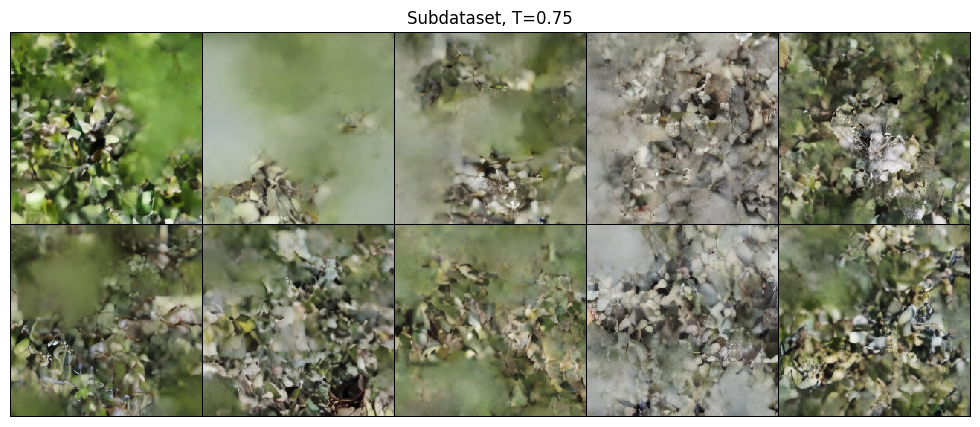

In [ ]:
generated_images = []
for i in range(generated_codes.shape[0]):
    codes = generated_codes[i].unsqueeze(0).to(device)
    img = codes_to_img(codes, vqvae)
    generated_images.append(img[0])

show_imgs(generated_images, temp=0.75)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06673372..1.0002809].


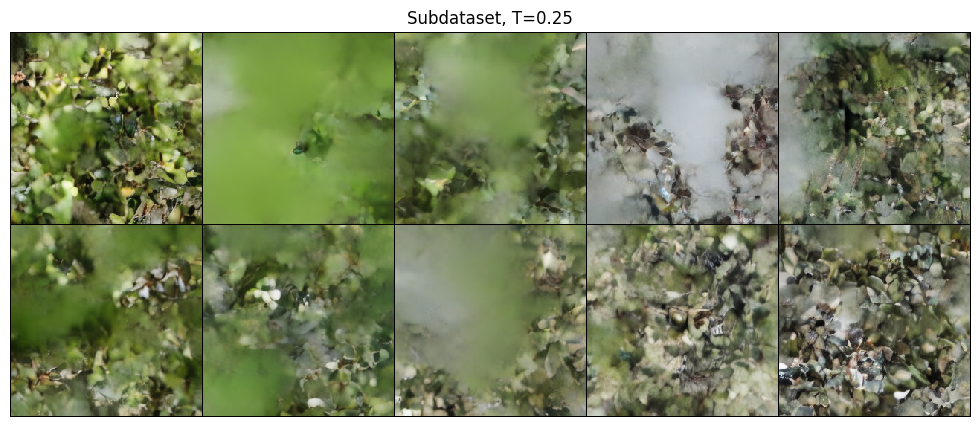

In [ ]:
model_conditional.eval()
with torch.no_grad():
    emb = emb.to(model_conditional.device)
    generated_codes = model_conditional.sample(img_shape=(10, 32, 32), clip_features=emb, temp=0.25)

generated_images = []
for i in range(generated_codes.shape[0]):
    codes = generated_codes[i].unsqueeze(0).to(device)
    img = codes_to_img(codes, vqvae)
    generated_images.append(img[0])

show_imgs(generated_images, temp=0.25)

# Полный датасет

In [ ]:
train_dataset_txt_full, val_dataset_txt_full = torch.utils.data.random_split(dataset_img_txt_full, [int(0.8*len(dataset_img_txt_full)), len(dataset_img_txt_full) - int(0.8*len(dataset_img_txt_full))], generator=torch.Generator().manual_seed(42))
train_loader_txt_full = DataLoader(train_dataset_txt_full, batch_size=32, shuffle=True)
val_loader_txt_full = DataLoader(val_dataset_txt_full, batch_size=32, shuffle=False)

In [ ]:
model_conditional_full = ConditionalPixelCNN(
    c_in=1,
    c_hidden=128,
    num_embeddings=4096,
    clip_emb_dim=1024,
).to(device)

trainer = pl.Trainer(
    default_root_dir=os.path.join(CHECKPOINT_PATH, "ConditionalPixelCNN"),
    accelerator="gpu" if str(device).startswith("cuda") else "cpu",
    devices=1,
    max_epochs=45,
    callbacks=[
        ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_bpd"),
        LearningRateMonitor("epoch")
    ],
    log_every_n_steps=10,
    enable_progress_bar=True,
    logger=True
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\logger_connector\logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [ ]:
trainer.fit(model_conditional_full, train_loader_txt_full, val_loader_txt_full)

You are using a CUDA device ('NVIDIA GeForce RTX 4070 SUPER') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                       | Params | Mode  | FLOPs | In sizes         | Out sizes        
------------------------------------------------------------------------------------------------------------------
0 | embedding   | Embedding                  | 524 K  | train | 0     | [1, 32, 32]      | [1, 32, 32, 128] 
1 | conv_vstack | VerticalStackConvolution   | 147 K  | train | 301 M | [1, 128, 32, 32] | [1, 128, 32, 32] 
2 | conv_hstack | HorizontalStackConvolution | 49.3 K | train | 100 M | [1, 128, 32, 32] | [1, 128, 32, 32] 
3 | cond_proj   | Linear            

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=45` reached.


In [ ]:
model_conditional_full = model_conditional_full.to(device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20259398..1.1285917].


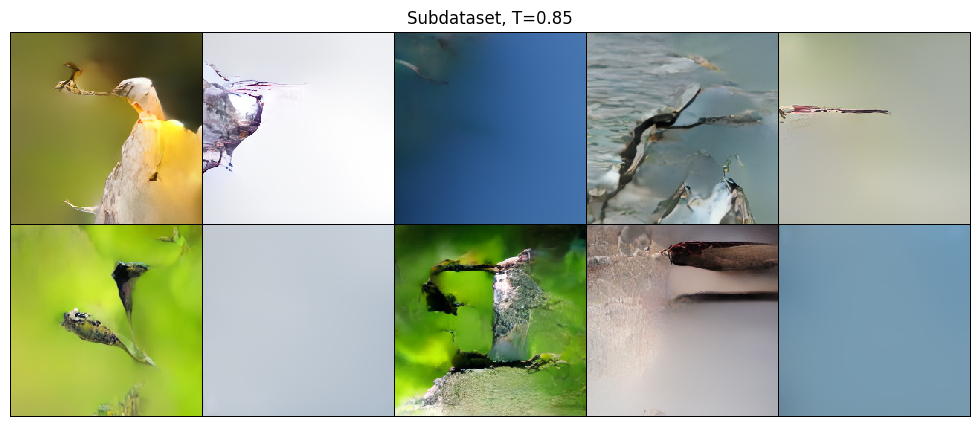

In [ ]:
emb = emb.to(device)
model_conditional_full.eval()
with torch.no_grad():
    generated_codes = model_conditional_full.sample(img_shape=(10, 32, 32), clip_features=emb, temp=0.8)

generated_images = []
for i in range(generated_codes.shape[0]):
    codes = generated_codes[i].unsqueeze(0).to(device)
    img = codes_to_img(codes, vqvae)
    generated_images.append(img[0])

show_imgs(generated_images, temp=0.85)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14546424..1.0961108].


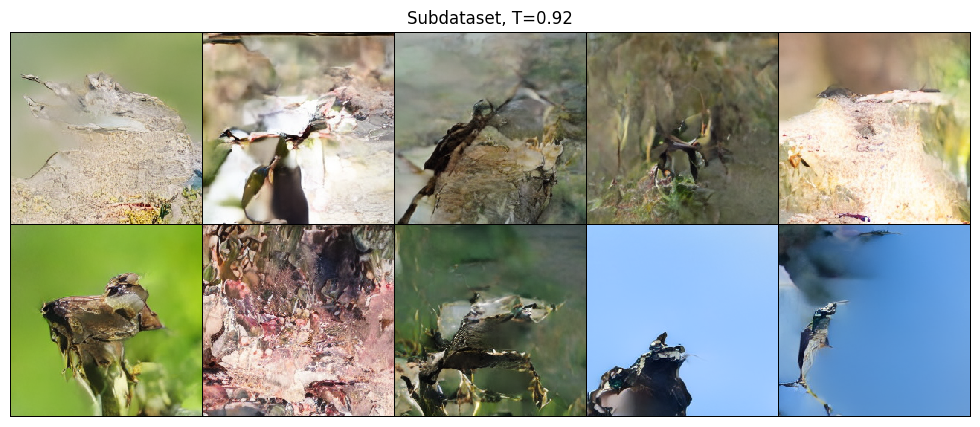

In [ ]:
emb = emb.to(device)
model_conditional_full.eval()
with torch.no_grad():
    generated_codes = model_conditional_full.sample(img_shape=(10, 32, 32), clip_features=emb, temp=0.92)

generated_images = []
for i in range(generated_codes.shape[0]):
    codes = generated_codes[i].unsqueeze(0).to(device)
    img = codes_to_img(codes, vqvae)
    generated_images.append(img[0])

show_imgs(generated_images, temp=0.92)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2135281..1.2049694].


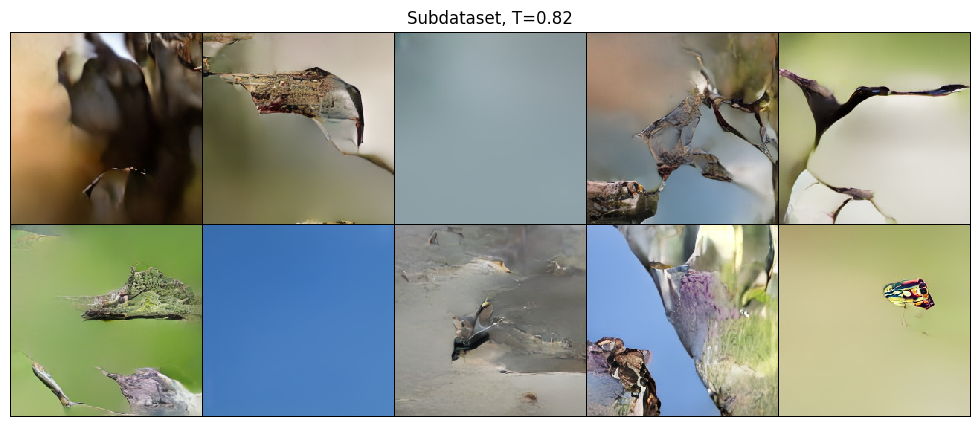

In [ ]:
emb = emb.to(device)
model_conditional_full.eval()
with torch.no_grad():
    generated_codes = model_conditional_full.sample(img_shape=(10, 32, 32), clip_features=emb, temp=0.82)

generated_images = []
for i in range(generated_codes.shape[0]):
    codes = generated_codes[i].unsqueeze(0).to(device)
    img = codes_to_img(codes, vqvae)
    generated_images.append(img[0])

show_imgs(generated_images, temp=0.82)

На полном датасете получил bpd = 10.4 на ваидации. Лучшей температруой оказалась T = 0.92. На некоторых картинках прослеживаются очертания птиц.

### Задание 6 (0.5 балла).

Добавьте [classifier-free guidance](https://colab.research.google.com/drive/1EIsBxlTcz3ZB0j-ZxN1gWD2dSQq6krPj?usp=sharing) на этапе инференса для увеличения разнообразия генерации. Проведите несколько экспериментов.

Для улучшения качества и разнообразия генерации (опционально) можно добавить [classifier-free guidance и на этапе обучения](https://education.yandex.ru/handbook/ml/article/diffuzionnye-modeli):
- для этого во время обучения эмбеддинг промпта заменяется с какой-то фиксированной вероятностью (например, 10%) на эмбеддинг пустого промпта

In [ ]:
class ConditionalPixelCNNGuidance(ConditionalPixelCNN):
    @torch.no_grad()
    def sample_guidance(self, img_shape, clip_features_pos, guidance=1.0, temp=0.92):
        B, H, W = img_shape
        img_pos = torch.zeros(img_shape, dtype=torch.long).to(self.device)
        empty_token_embed = torch.zeros(self.clip_emb_dim, device=self.device, dtype=clip_features_pos.dtype)
        clip_features_neg = empty_token_embed.unsqueeze(0).expand(B, -1)
        for h in tqdm(range(H), leave=False):
            for w in range(W):
                logits_pos = self.forward(img_pos, clip_features_pos)
                logits_neg = self.forward(img_pos, clip_features_neg)

                logits_guidance = logits_pos - logits_neg
                logits_pos = logits_pos[:, :, h, w]
                logits_guidance = logits_guidance[:, :, h, w]
                logits = logits_pos + guidance * logits_guidance
                logits = logits / temp
                probs = F.softmax(logits, dim=-1)
                sampled_tokens = torch.multinomial(probs, num_samples=1).squeeze(dim=-1)
                img_pos[:, h, w] = sampled_tokens

        return img_pos

In [ ]:
model_conditional_full_g = ConditionalPixelCNNGuidance(
    c_in=1,
    c_hidden=256,
    num_embeddings=4096,
    clip_emb_dim=1024,
).to(device)

trainer = pl.Trainer(
    default_root_dir=os.path.join(CHECKPOINT_PATH, "ConditionalPixelCNNGuidance"),
    accelerator="gpu" if str(device).startswith("cuda") else "cpu",
    devices=1,
    max_epochs=45,
    callbacks=[
        ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_bpd"),
        LearningRateMonitor("epoch")
    ],
    log_every_n_steps=10,
    enable_progress_bar=True,
    logger=True
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\logger_connector\logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [ ]:
trainer.fit(model_conditional_full_g, train_loader_txt_full, val_loader_txt_full)

You are using a CUDA device ('NVIDIA GeForce RTX 4070 SUPER') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                       | Params | Mode  | FLOPs | In sizes         | Out sizes        
------------------------------------------------------------------------------------------------------------------
0 | embedding   | Embedding                  | 1.0 M  | train | 0     | [1, 32, 32]      | [1, 32, 32, 256] 
1 | conv_vstack | VerticalStackConvolution   | 590 K  | train | 1.2 B | [1, 256, 32, 32] | [1, 256, 32, 32] 
2 | conv_hstack | HorizontalStackConvolution | 196 K  | train | 402 M | [1, 256, 32, 32] | [1, 256, 32, 32] 
3 | cond_proj   | Linear            

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
a:\projects\gen\nlp22\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=45` reached.


In [ ]:
emb = emb.to(device)
model_conditional_full_g.to(device)

ConditionalPixelCNNGuidance(
  (embedding): Embedding(4096, 256)
  (conv_vstack): VerticalStackConvolution(
    (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (conv_hstack): HorizontalStackConvolution(
    (conv): Conv2d(256, 256, kernel_size=(1, 3), stride=(1, 1), padding=(0, 1))
  )
  (cond_proj): Linear(in_features=1024, out_features=256, bias=True)
  (conv_layers): ModuleList(
    (0): GatedMaskedConv(
      (conv_vert): VerticalStackConvolution(
        (conv): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (conv_horiz): HorizontalStackConvolution(
        (conv): Conv2d(256, 512, kernel_size=(1, 3), stride=(1, 1), padding=(0, 1))
      )
      (conv_vert_to_horiz): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (conv_horiz_1x1): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    )
    (1): GatedMaskedConv(
      (conv_vert): VerticalStackConvolution(
        (conv): Conv2d(256, 512, kernel_size=

# 1) guidance=1.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.109511614..1.0388219].


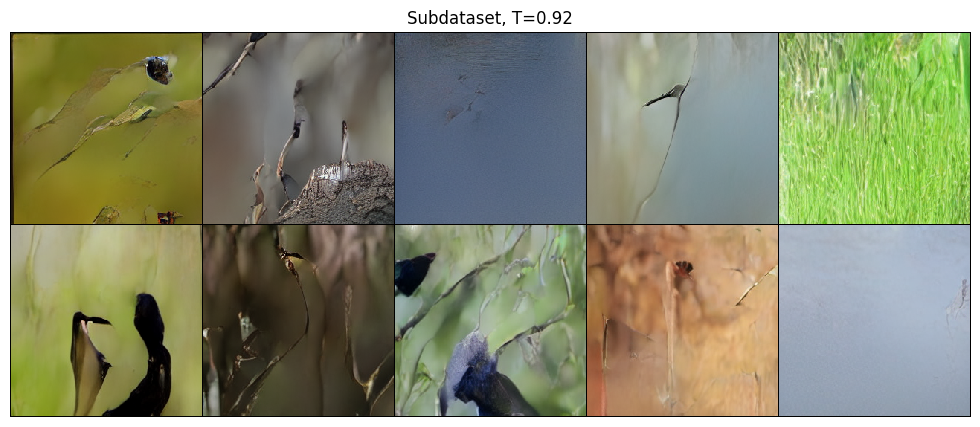

In [ ]:
with torch.no_grad():
    generated_codes_g = model_conditional_full_g.sample_guidance(
        img_shape=(10, 32, 32),
        clip_features_pos=emb,
        guidance=1.0,
        temp=0.92
    )

generated_images_g = []
for i in range(generated_codes_g.shape[0]):
    codes = generated_codes_g[i].unsqueeze(0)
    img = codes_to_img(codes, vqvae)
    generated_images_g.append(img[0])

show_imgs(generated_images_g, temp=0.92)

# 2) guidance=5.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24353307..0.9746591].


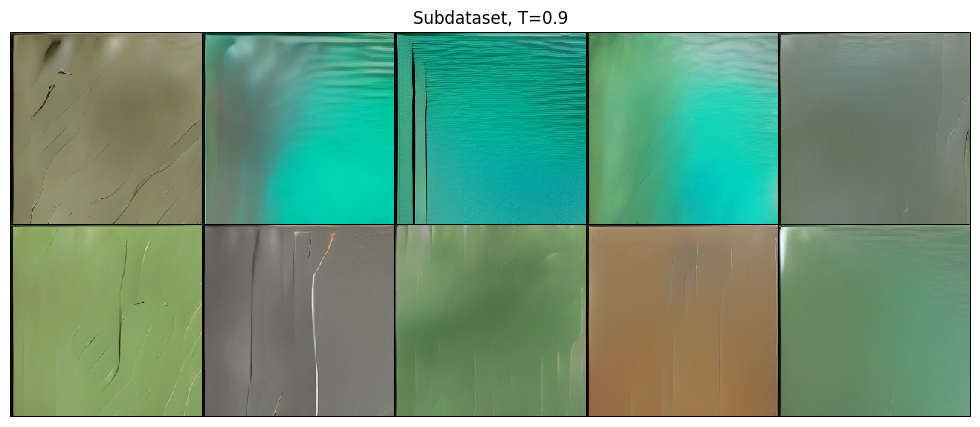

In [ ]:
with torch.no_grad():
        generated_codes_g = model_conditional_full_g.sample_guidance(
            img_shape=(10, 32, 32),
            clip_features_pos=emb,
            guidance=5.0,
            temp=0.9
        )
generated_images_g = []
for i in range(generated_codes_g.shape[0]):
    codes = generated_codes_g[i].unsqueeze(0)
    img = codes_to_img(codes, vqvae)
    generated_images_g.append(img[0])

show_imgs(generated_images_g, temp=0.9)

# 3) guidance=3.0, T = 0.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2633655..0.9910568].


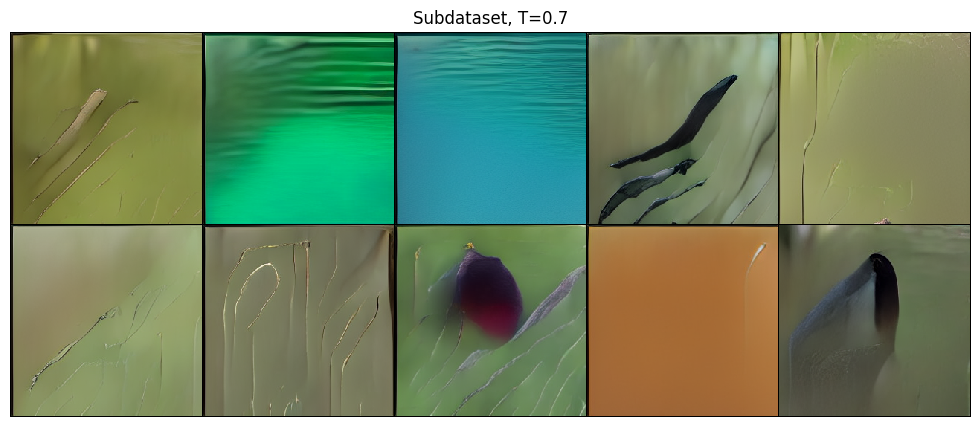

In [ ]:
with torch.no_grad():
    generated_codes_g = model_conditional_full_g.sample_guidance(
        img_shape=(10, 32, 32),
        clip_features_pos=emb,
        guidance=3.0,
        temp=0.7
    )
generated_images_g = []
for i in range(generated_codes_g.shape[0]):
    codes = generated_codes_g[i].unsqueeze(0)
    img = codes_to_img(codes, vqvae)
    generated_images_g.append(img[0])

show_imgs(generated_images_g, temp=0.7)

Улучшения очертаний не наблюдается.

### Задание 7 (0.5 балла)

Реализуйте какую-нибудь метрику качества генерации - на ваш выбор (это может быть Inception Score, Frechet Inception Distance, LPIPS или что-то другое). Вам необходимо привести работающий код для вычисления метрики и текстом пояснить как работает метрика.

Далее вычислите значение этой метрики для обученной в задании 5 модели и сделайте выводы.

### Задание 8 (0.5 балла).

Можете делать любые действия для улучшения работы вашей модели (менять число слоев, параметры архитектуры - не отходя от концепции PixelCNN, менять гиперпараметры, делать аугментацию изображений и текстов и так далее).

Проведите эксперименты по улучшению качества модели - оценивайте качество модели с точки зрения:
- Реализованной в задании 7 метрики
- Визуально.

Мы ожидаем, что качество может не вырасти, но и не упадет.

In [ ]:
# ваш код здесь

### Задание 9 (1.5 балла).

Проанализируйте лучшую модель:

- Придумайте 5 разных признаков (например, цвет, вид оперения, длина клюва, лап и так далее) и посмотрите, будет ли модель их понимать благодаря текстовому эмбеддингу? (0.5 балла)

- Попробуйте добавлять в модель другие промпты - не связанные с птицами, или по-другому построенные (не "a photo of", а по-другому сформулированные). Как отрабатывает модель? (0.5 балла)

- Фиксируйте удачный промпт и проведите эксперименты по изменению веса guidance в classifer-free подходе. Сделайте выводы. (0.5 балла)

In [ ]:
# ваш код здесь